In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

sns.set(rc={'figure.figsize': [10, 10]}, font_scale=1.3)

In [2]:
pip install imblearn

     -------------------------------------- 199.3/199.3 kB 2.4 MB/s eta 0:00:00
     ---------------------------------------- 7.3/7.3 MB 6.5 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.1
    Uninstalling scikit-learn-0.24.1:
      Successfully uninstalled scikit-learn-0.24.1
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [3]:
df=pd.read_csv(r'C:\Users\athoi\Desktop\Loan_Default.csv')

convert all feature to lower case

In [4]:
df.columns= df.columns.str.lower()

In [5]:
df.columns

Index(['id', 'year', 'loan_limit', 'gender', 'approv_in_adv', 'loan_type',
       'loan_purpose', 'credit_worthiness', 'open_credit',
       'business_or_commercial', 'loan_amount', 'rate_of_interest',
       'interest_rate_spread', 'upfront_charges', 'term', 'neg_ammortization',
       'interest_only', 'lump_sum_payment', 'property_value',
       'construction_type', 'occupancy_type', 'secured_by', 'total_units',
       'income', 'credit_type', 'credit_score', 'co-applicant_credit_type',
       'age', 'submission_of_application', 'ltv', 'region', 'security_type',
       'status', 'dtir1'],
      dtype='object')

Things to consider before taking a loan (in general)
Factors Lenders Look at When Considering  Loan Application
Loan-specific variables :DTIr, LTV, Interest rate, property value, loan_type, loan_amount,term, loan_amount, status
Borrower-specific variables age, income, credit score, etc.


#### we can drpo 'id' ,'loan_limit' , 'gender' ,'approv_in_adv' ,'loan_purpose' ,'open_credit' ,'business_or_commercial'  because they don't add any valiable information 
#### we can drop 'year' as it includes only one year 2019

In [6]:
columns= ['id', 'year', 'loan_limit', 'gender', 'approv_in_adv','loan_purpose', 'credit_worthiness', 'open_credit','business_or_commercial','interest_rate_spread', 'upfront_charges', 'neg_ammortization','interest_only', 'lump_sum_payment','construction_type', 'occupancy_type', 'secured_by', 'total_units','credit_type', 'co-applicant_credit_type','submission_of_application','region', 'security_type']
df.drop(columns,axis=1, inplace =True)

In [7]:
df.columns

Index(['loan_type', 'loan_amount', 'rate_of_interest', 'term',
       'property_value', 'income', 'credit_score', 'age', 'ltv', 'status',
       'dtir1'],
      dtype='object')

In [8]:
df.shape

(148670, 11)

In [9]:
df.isna().sum()

loan_type               0
loan_amount             0
rate_of_interest    36439
term                   41
property_value      15098
income               9150
credit_score            0
age                   200
ltv                 15098
status                  0
dtir1               24121
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   loan_type         148670 non-null  object 
 1   loan_amount       148670 non-null  int64  
 2   rate_of_interest  112231 non-null  float64
 3   term              148629 non-null  float64
 4   property_value    133572 non-null  float64
 5   income            139520 non-null  float64
 6   credit_score      148670 non-null  int64  
 7   age               148470 non-null  object 
 8   ltv               133572 non-null  float64
 9   status            148670 non-null  int64  
 10  dtir1             124549 non-null  float64
dtypes: float64(6), int64(3), object(2)
memory usage: 12.5+ MB


Imputation for the missing values

In [11]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
df[['rate_of_interest','term','property_value','income','ltv','dtir1']] = imputer.fit_transform(df[['rate_of_interest','term','property_value','income','ltv','dtir1']])

In [12]:
df.isna().sum()

loan_type             0
loan_amount           0
rate_of_interest      0
term                  0
property_value        0
income                0
credit_score          0
age                 200
ltv                   0
status                0
dtir1                 0
dtype: int64

In [13]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent')
df[['age']] = imputer.fit_transform(df[['age']])

In [19]:
df.isna().sum()

loan_type           0
loan_amount         0
rate_of_interest    0
term                0
property_value      0
income              0
credit_score        0
age                 0
ltv                 0
status              0
dtir1               0
dtype: int64

In [20]:
df.head()

,loan_type,loan_amount,rate_of_interest,term,property_value,income,credit_score,age,ltv,status,dtir1
0,type1,116500,4.045476,360.0,118000.000000,1740.0,758,25-34,98.728814,1,45.000000
1,type2,206500,4.045476,360.0,497893.465696,4980.0,552,55-64,72.746457,1,37.732932
2,type1,406500,4.560000,360.0,508000.000000,9480.0,834,35-44,80.019685,0,46.000000
3,type1,456500,4.250000,360.0,658000.000000,11880.0,587,45-54,69.376900,0,42.000000
4,type1,696500,4.000000,360.0,758000.000000,10440.0,602,25-34,91.886544,0,39.000000


In [21]:
df.tail()

,loan_type,loan_amount,rate_of_interest,term,property_value,income,credit_score,age,ltv,status,dtir1
148665,type1,436500,3.125,180.0,608000.0,7860.0,659,55-64,71.792763,0,48.0
148666,type1,586500,5.190,360.0,788000.0,7140.0,569,25-34,74.428934,0,15.0
148667,type1,446500,3.125,180.0,728000.0,6900.0,702,45-54,61.332418,0,49.0
148668,type1,196500,3.500,180.0,278000.0,7140.0,737,55-64,70.683453,0,29.0
148669,type1,406500,4.375,240.0,558000.0,7260.0,830,45-54,72.849462,0,44.0


  0%|          | 0/592 [00:00<?, ?it/s]


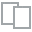
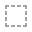
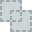
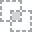
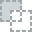
...
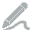
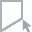
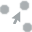
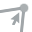
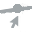

In [22]:
##Ploting all the variables
from dataprep.eda import plot
plot(df)

C:\Users\athoi\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4868: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


100%|##########| 4/4 [00:00<?, ?it/s]


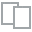
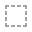
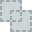
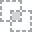
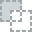
...
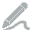
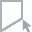
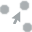
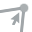
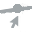

In [23]:
from dataprep.eda import plot_correlation
plot_correlation(df)

  0%|          | 0/150 [00:00<?, ?it/s]

C:\Users\athoi\anaconda3\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))



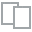
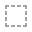
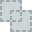
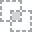
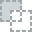
...
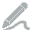
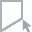
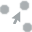
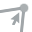
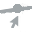

In [24]:
##Finding the Missing Values
from dataprep.eda import plot_missing
plot_missing(df)

Note: All the above there correlation tests are showing that the correlation among variables are not too significant which we also found in our scatter plot matrix. So it also shows that there is no multicolinierity among variables

In [25]:
##Creating the EDA Report for Loan_Default Dataset
from dataprep.eda import create_report
eda_report = create_report(df)

  0%|          | 0/1856 [00:00<?, ?it/s]

C:\Users\athoi\anaconda3\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\athoi\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4868: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))
C:\Users\athoi\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4868: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))
C:\Users\athoi\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4868: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))



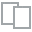
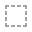
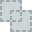
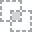
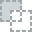
...
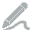
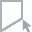
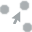
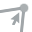
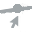

In [26]:
eda_report.show()

In [27]:
eda_report.save('eda_report')

Report has been saved to eda_report.html!


In [28]:
eda_report.show_browser()

We descoverd that there is a problem in the data must be handeled

In [29]:
df['income'].value_counts()

6957.338876     9150
0.000000        1260
3600.000000     1250
4200.000000     1243
4800.000000     1191
                ... 
58620.000000       1
86340.000000       1
40080.000000       1
81180.000000       1
53160.000000       1
Name: income, Length: 1002, dtype: int64

people with zero income there.

In [30]:
mask=df['income']<2000

In [31]:
mask.value_counts()            # there is income less than 2000

False    140711
True       7959
Name: income, dtype: int64

In [32]:
df['income']=df['income'].apply(lambda x: x if x not in mask else df['income'].mean())

In [33]:
mask=df['income']<2000
mask.value_counts()

False    148670
Name: income, dtype: int64

In [34]:
#There are some zero interest rate
df['rate_of_interest'].min()      # interest rate shall not be zero

0.0

In [35]:
df['rate_of_interest'].mean()

4.0454758043658865

In [36]:
mask=df['rate_of_interest']==0
mask.value_counts()

False    148669
True          1
Name: rate_of_interest, dtype: int64

In [37]:
df['rate_of_interest']=df['rate_of_interest'].apply(lambda x: x if x not in mask else df['rate_of_interest'].mean())

In [38]:
df['rate_of_interest'].min()

2.125

<AxesSubplot:xlabel='loan_type', ylabel='count'>

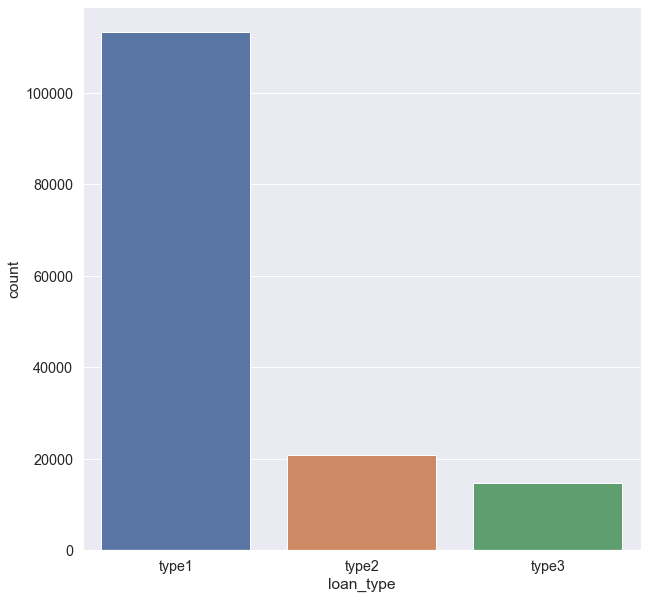

In [39]:
sns.countplot(data=df , x='loan_type')

<AxesSubplot:xlabel='status', ylabel='count'>

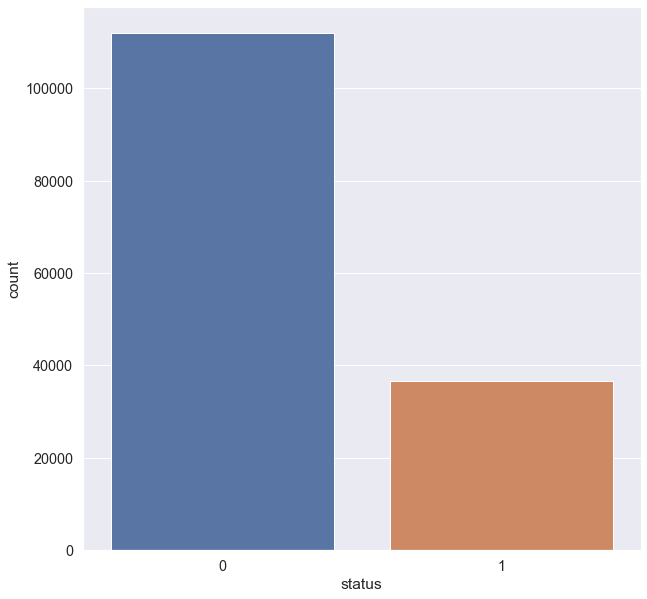

In [74]:
sns.countplot(data=df , x='status')

<AxesSubplot:xlabel='age', ylabel='count'>

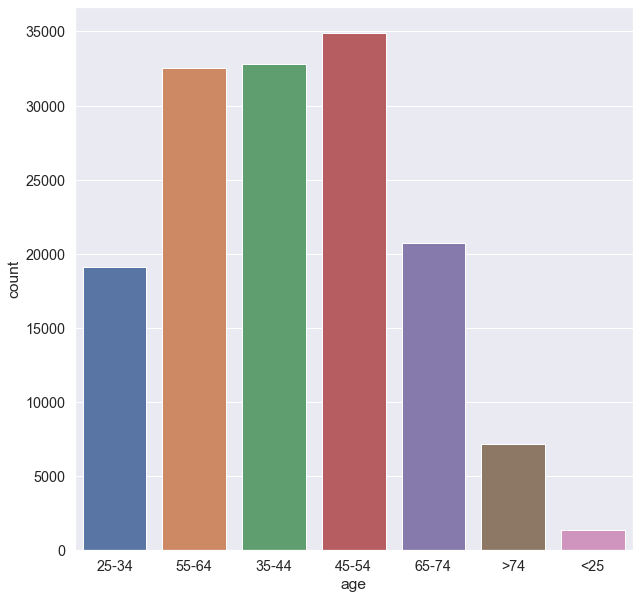

In [40]:
sns.countplot(data=df , x='age')

<AxesSubplot:xlabel='rate_of_interest', ylabel='income'>

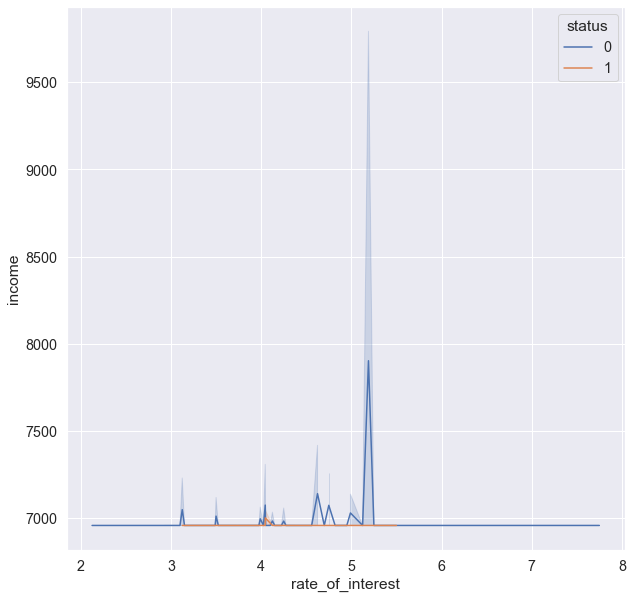

In [41]:
sns.lineplot(data=df, x="rate_of_interest", y="income", hue="status")

<AxesSubplot:>

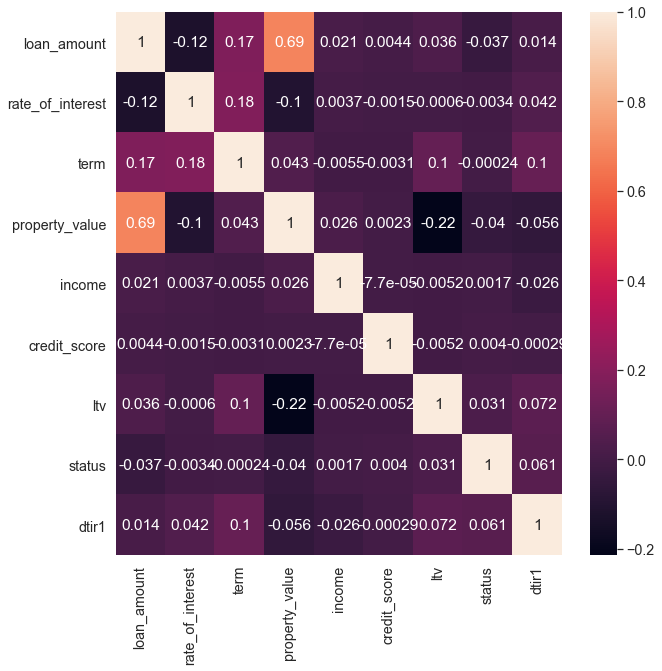

In [42]:
sns.heatmap(df.corr() , annot = True)

All data must be numerical to be used in the machine learning model

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   loan_type         148670 non-null  object 
 1   loan_amount       148670 non-null  int64  
 2   rate_of_interest  148670 non-null  float64
 3   term              148670 non-null  float64
 4   property_value    148670 non-null  float64
 5   income            148670 non-null  float64
 6   credit_score      148670 non-null  int64  
 7   age               148670 non-null  object 
 8   ltv               148670 non-null  float64
 9   status            148670 non-null  int64  
 10  dtir1             148670 non-null  float64
dtypes: float64(6), int64(3), object(2)
memory usage: 12.5+ MB


In [44]:
df = pd.get_dummies(df, columns=['loan_type','age'], drop_first=True)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   loan_amount       148670 non-null  int64  
 1   rate_of_interest  148670 non-null  float64
 2   term              148670 non-null  float64
 3   property_value    148670 non-null  float64
 4   income            148670 non-null  float64
 5   credit_score      148670 non-null  int64  
 6   ltv               148670 non-null  float64
 7   status            148670 non-null  int64  
 8   dtir1             148670 non-null  float64
 9   loan_type_type2   148670 non-null  uint8  
 10  loan_type_type3   148670 non-null  uint8  
 11  age_35-44         148670 non-null  uint8  
 12  age_45-54         148670 non-null  uint8  
 13  age_55-64         148670 non-null  uint8  
 14  age_65-74         148670 non-null  uint8  
 15  age_<25           148670 non-null  uint8  
 16  age_>74           14

In [46]:
pd.set_option("display.max_columns", df.shape[-1]) 
df.head()

,loan_amount,rate_of_interest,term,property_value,income,credit_score,ltv,status,dtir1,loan_type_type2,loan_type_type3,age_35-44,age_45-54,age_55-64,age_65-74,age_<25,age_>74
0,116500,4.045476,360.0,118000.000000,6957.338876,758,98.728814,1,45.000000,0,0,0,0,0,0,0,0
1,206500,4.045476,360.0,497893.465696,6957.338876,552,72.746457,1,37.732932,1,0,0,0,1,0,0,0
2,406500,4.560000,360.0,508000.000000,6957.338876,834,80.019685,0,46.000000,0,0,1,0,0,0,0,0
3,456500,4.250000,360.0,658000.000000,6957.338876,587,69.376900,0,42.000000,0,0,0,1,0,0,0,0
4,696500,4.045476,360.0,758000.000000,6957.338876,602,91.886544,0,39.000000,0,0,0,0,0,0,0,0


Data split into train and test

In [47]:
x = df.drop('status', axis=1)
y = df['status']

In [48]:
x

,loan_amount,rate_of_interest,term,property_value,income,credit_score,ltv,dtir1,loan_type_type2,loan_type_type3,age_35-44,age_45-54,age_55-64,age_65-74,age_<25,age_>74
0,116500,4.045476,360.0,118000.000000,6957.338876,758,98.728814,45.000000,0,0,0,0,0,0,0,0
1,206500,4.045476,360.0,497893.465696,6957.338876,552,72.746457,37.732932,1,0,0,0,1,0,0,0
2,406500,4.560000,360.0,508000.000000,6957.338876,834,80.019685,46.000000,0,0,1,0,0,0,0,0
3,456500,4.250000,360.0,658000.000000,6957.338876,587,69.376900,42.000000,0,0,0,1,0,0,0,0
4,696500,4.045476,360.0,758000.000000,6957.338876,602,91.886544,39.000000,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,436500,3.125000,180.0,608000.000000,6957.338876,659,71.792763,48.000000,0,0,0,0,1,0,0,0
148666,586500,5.190000,360.0,788000.000000,6957.338876,569,74.428934,15.000000,0,0,0,0,0,0,0,0
148667,446500,3.125000,180.0,728000.000000,6957.338876,702,61.332418,49.000000,0,0,0,1,0,0,0,0
148668,196500,3.500000,180.0,278000.000000,6957.338876,737,70.683453,29.000000,0,0,0,0,1,0,0,0


In [49]:
y

0         1
1         1
2         0
3         0
4         0
         ..
148665    0
148666    0
148667    0
148668    0
148669    0
Name: status, Length: 148670, dtype: int64

In [62]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.3)

In [63]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

model=DecisionTreeClassifier()
model.fit(x_train,y_train)
y_pred=model.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))

[[32976   671]
 [  704 10250]]
0.9691710948185018


In [64]:
%matplotlib inline

from pathlib import Path

import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
import matplotlib.pylab as plt
!pip install dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary


In [65]:
fullClassTree= DecisionTreeClassifier()
fullClassTree.fit(x_train,y_train)

DecisionTreeClassifier()

In [55]:
pip install pydotplus

Note: you may need to restart the kernel to use updated packages.


In [66]:
plotDecisionTree(fullClassTree, feature_names=x_train.columns)

222 [label=<age_>74 &le; 0.5<br/>29<br/>[3, 26]>, fillcolor="#50a8e8"] ;
    ^
Expected "}", found '['  (at char 17396), (line:447, col:5)


AttributeError: 'NoneType' object has no attribute 'create_png'